In [4]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from math import sqrt
import seaborn as sns
import numpy as np
from tslearn.metrics import dtw
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import ward, dendrogram, fcluster, single, average, complete
from scipy.stats import spearmanr
from scipy.spatial.distance import pdist, squareform
from scipy.spatial.distance import euclidean
import networkx as nx

# 1. Loading in the Data and Basic Analysis

## 1.1 Data Preprocessing

Load in the ETF return data and index return data

In [5]:
Mutual_data = pd.read_csv("/Users/a/Dropbox/Thesis/Thesis/Coding/PreprocessedData/out-MutualFundRet.csv", index_col=0)

Index_data = pd.read_csv("/Users/a/Dropbox/Thesis/Thesis/Coding/PreprocessedData/out-index_data.csv",index_col=0)

In [6]:
Mutual_data.tail()

,DK0015966758,DK0060411247,DK0010270693,DK0060790087,DK0015911507,DK0015168686,DK0060814952,DK0060789071,DK0060048304,DK0010170398,...,DK0060819670,DK0010270503,DK0015919591,DK0060815843,DK0016275118,DK0060477859,DK0060646396,DK0060825214,DK0060360824,DK0000581083
EndDate,,,,,,,,,,,,,,,,,,,,,
2020-04-08,0.047775,0.044041,0.060891,0.001050,0.057798,-0.000765,0.001640,0.053871,0.062527,-0.007276,...,0.092650,0.054592,0.097190,0.054221,0.000857,-0.009191,0.001457,0.044024,0.067358,0.034978
2020-04-15,0.008796,0.013150,0.014569,0.007585,0.024684,0.005913,0.017409,0.011793,0.017625,0.006301,...,-0.019564,0.011432,-0.036308,0.012977,0.002986,0.052970,0.017455,0.015999,0.027037,0.043415
2020-04-22,0.015552,-0.017020,0.012160,0.002202,0.033286,0.000121,-0.021898,0.022646,0.009546,0.000635,...,0.007023,0.022581,0.002689,0.035541,0.000731,-0.011144,-0.022150,0.012041,0.014363,-0.026021
2020-04-29,0.021959,0.040132,0.048055,0.002112,0.028441,0.003028,0.001610,0.032478,0.055566,0.009967,...,0.079111,0.032597,0.064225,0.030694,0.001461,-0.005687,0.001820,0.024974,0.046490,0.045620
2020-05-06,-0.002196,0.009748,-0.017213,0.001607,0.012121,0.000888,0.022425,-0.013095,-0.030039,-0.003460,...,-0.055329,-0.013223,-0.023732,-0.027778,0.000021,0.008287,0.022924,-0.016660,-0.002303,-0.005897


In [7]:
Index_data.tail(5)

,AsiaSMALL LoBO,AsiaME1 BO2,AsiaME1 BO3,AsiaME1 BO4,AsiaSMALL HiBO,AsiaME2 BO1,AsiaME2 BO2,AsiaME2 BO3,AsiaME2 BO4,AsiaME2 BO5,...,Insur,RlEst,Fin,Other,LEATTREU Index,LET1TREU Index,LET3TREU Index,LET5TREU Index,LET7TREU Index,LET0TREU Index
,,,,,,,,,,,,,,,,,,,,,
2019-12-04,-0.013340,-0.003252,0.003539,-0.011960,-0.010497,-0.019356,0.002167,-0.017582,-0.005644,-0.009438,...,-0.023567,-0.014306,-0.018952,-0.021241,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-11,-0.008032,0.002023,-0.009880,0.003412,0.004531,-0.005038,-0.001529,0.009644,-0.002048,-0.000963,...,-0.000262,0.009499,0.002612,0.010527,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-18,0.012140,0.015043,0.016649,0.017383,0.005285,0.010156,0.018426,0.021130,0.018428,0.022175,...,0.027315,0.019196,0.010113,0.008595,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-25,0.008918,0.013354,0.014367,0.000291,0.014436,0.006811,0.014440,0.017171,0.014573,0.015373,...,0.004890,0.010268,0.005190,0.009818,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01,0.011569,0.005836,-0.002144,0.009836,0.004933,0.013756,0.002525,0.000334,0.004925,0.004526,...,-0.008795,-0.004644,-0.011985,-0.008804,NaN,NaN,NaN,NaN,NaN,NaN


The indexes are objects and we need to change them to daytime

In [8]:
Mutual_data.index = pd.to_datetime(Mutual_data.index, dayfirst = True)

In [9]:
Index_data.index = pd.to_datetime(Index_data.index, dayfirst=True)

Now we can join the two dataframes on the index of the ETF dataframe.

In [10]:
joined = Mutual_data.join(Index_data)

In [11]:
joined

,DK0015966758,DK0060411247,DK0010270693,DK0060790087,DK0015911507,DK0015168686,DK0060814952,DK0060789071,DK0060048304,DK0010170398,...,Insur,RlEst,Fin,Other,LEATTREU Index,LET1TREU Index,LET3TREU Index,LET5TREU Index,LET7TREU Index,LET0TREU Index
EndDate,,,,,,,,,,,,,,,,,,,,,
2014-09-17,-0.010665,-0.009281,-0.000938,0.000263,-0.000578,0.000414,-0.005513,-0.004706,0.003172,0.001160,...,0.006067,-0.005924,0.020307,0.013098,0.004270,0.000560,0.002496,0.004411,0.005620,0.007507
2014-09-24,-0.001760,0.007648,-0.005283,0.001141,-0.009839,0.001892,0.002349,0.004111,-0.002259,0.011781,...,0.007661,-0.008260,0.001517,0.005168,0.003626,-0.000056,0.000381,0.001109,0.003562,0.010203
2014-10-01,-0.004334,0.006845,-0.004013,-0.000614,-0.020124,0.003422,-0.010967,0.004709,0.001207,0.013934,...,-0.020985,-0.021133,-0.016002,-0.012500,0.002894,-0.000056,0.000489,0.001491,0.003176,0.007490
2014-10-08,-0.020955,-0.019812,-0.027491,0.000526,0.010652,0.001058,-0.000284,-0.029817,-0.014093,-0.000565,...,-0.000254,-0.004398,0.001961,0.005572,0.001167,-0.000336,0.000077,0.000938,0.002085,0.002663
2014-10-15,-0.010852,-0.031494,-0.058609,0.000088,-0.026728,0.004229,-0.004077,-0.045856,-0.031035,0.004709,...,-0.052006,-0.056164,-0.062589,-0.042066,-0.004158,-0.001175,-0.003055,-0.004442,-0.004556,-0.006895
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-08,0.047775,0.044041,0.060891,0.001050,0.057798,-0.000765,0.001640,0.053871,0.062527,-0.007276,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-15,0.008796,0.013150,0.014569,0.007585,0.024684,0.005913,0.017409,0.011793,0.017625,0.006301,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-22,0.015552,-0.017020,0.012160,0.002202,0.033286,0.000121,-0.021898,0.022646,0.009546,0.000635,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
joined.index.dtype

dtype('<M8[ns]')

We only have the index data until the 2019-04-10 so we need to cut the end of the dataframe.

In [13]:
enddate = "04-11-2019" 

joined = joined[joined.index < enddate]

joined.tail()

,DK0015966758,DK0060411247,DK0010270693,DK0060790087,DK0015911507,DK0015168686,DK0060814952,DK0060789071,DK0060048304,DK0010170398,...,Insur,RlEst,Fin,Other,LEATTREU Index,LET1TREU Index,LET3TREU Index,LET5TREU Index,LET7TREU Index,LET0TREU Index
EndDate,,,,,,,,,,,,,,,,,,,,,
2019-03-13,-0.000919,0.002519,0.005353,0.002573,0.003018,0.003050,0.004080,0.006200,0.006998,0.005797,...,0.018714,-0.002824,-0.001776,0.022301,-0.000839,-0.000167,-0.000460,-0.000675,-0.000740,-0.001616
2019-03-20,0.013745,0.012494,0.006053,0.001203,0.004957,0.000015,0.007549,-0.000561,-0.000611,-0.001372,...,-0.016113,-0.024386,-0.011934,-0.006389,0.008319,0.000222,0.001439,0.003326,0.007220,0.020606
2019-03-27,-0.001298,-0.005976,-0.007936,0.001403,0.004273,0.005718,0.002391,-0.004681,-0.000002,0.019800,...,-0.000718,0.004927,-0.008209,0.003505,0.000740,0.000222,0.000839,0.001018,0.000942,0.000760
2019-04-03,0.041891,0.015862,0.033522,0.000576,0.032917,-0.004149,0.003642,0.028391,0.018082,-0.007260,...,0.018245,0.040046,0.052647,0.019539,-0.002148,-0.000666,-0.001088,-0.001379,-0.002429,-0.003900
2019-04-10,0.005644,0.006620,-0.002683,0.000042,0.002526,0.001856,-0.000575,-0.003730,-0.001137,0.001103,...,0.004748,0.001318,0.003198,-0.011486,-0.000404,0.000333,0.000638,0.000984,0.000106,-0.002371


**Calculate the spearman correlation of between the indexes.**

In [14]:
corr = joined.corr(method="spearman")

In [15]:
corr

,DK0015966758,DK0060411247,DK0010270693,DK0060790087,DK0015911507,DK0015168686,DK0060814952,DK0060789071,DK0060048304,DK0010170398,...,Insur,RlEst,Fin,Other,LEATTREU Index,LET1TREU Index,LET3TREU Index,LET5TREU Index,LET7TREU Index,LET0TREU Index
DK0015966758,1.000000,0.690676,0.746997,0.422632,0.819090,0.074255,0.388898,0.760716,0.693854,0.241606,...,0.461610,0.506987,0.531497,0.456690,0.024353,-0.002458,0.012973,0.038237,0.026222,0.021349
DK0060411247,0.690676,1.000000,0.710761,0.478242,0.596885,0.126103,0.437975,0.743009,0.715835,0.297555,...,0.512966,0.455676,0.540348,0.543186,0.050674,0.027820,0.022301,0.046451,0.050280,0.055256
DK0010270693,0.746997,0.710761,1.000000,0.279199,0.652772,-0.043222,0.283751,0.924725,0.831801,0.245957,...,0.649208,0.628296,0.732661,0.637413,0.005288,0.012165,0.013326,0.037414,0.022972,-0.006019
DK0060790087,0.422632,0.478242,0.279199,1.000000,0.444543,0.650310,0.646012,0.339440,0.420702,0.374012,...,0.219555,0.256608,0.198006,0.269419,0.126553,0.043381,0.080065,0.108223,0.122188,0.137233
DK0015911507,0.819090,0.596885,0.652772,0.444543,1.000000,0.086972,0.451146,0.652307,0.628712,0.183883,...,0.366741,0.462289,0.462815,0.406706,0.055046,0.023734,0.053766,0.089563,0.089743,0.045755
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LET1TREU Index,-0.002458,0.027820,0.012165,0.043381,0.023734,0.170862,0.028590,0.016694,0.032182,0.184536,...,0.022840,-0.010136,0.001523,0.067679,0.688705,1.000000,0.938929,0.847841,0.714070,0.574305
LET3TREU Index,0.012973,0.022301,0.013326,0.080065,0.053766,0.209748,0.040556,0.016560,0.049513,0.211361,...,0.017534,-0.011846,-0.028658,0.054059,0.823689,0.938929,1.000000,0.963694,0.863438,0.715159
LET5TREU Index,0.038237,0.046451,0.037414,0.108223,0.089563,0.240758,0.036743,0.040478,0.090963,0.227118,...,0.034655,-0.000896,-0.033604,0.056588,0.917321,0.847841,0.963694,1.000000,0.953741,0.829486
LET7TREU Index,0.026222,0.050280,0.022972,0.122188,0.089743,0.263830,0.006479,0.027265,0.093334,0.254079,...,0.032894,-0.013195,-0.062238,0.036791,0.972023,0.714070,0.863438,0.953741,1.000000,0.923297


Save the upper half diagonal of the matrix

In [16]:
mask = np.triu(np.ones_like(corr, dtype=np.bool))

In [17]:
mask

array([[ True,  True,  True, ...,  True,  True,  True],
       [False,  True,  True, ...,  True,  True,  True],
       [False, False,  True, ...,  True,  True,  True],
       ...,
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ..., False,  True,  True],
       [False, False, False, ..., False, False,  True]])

In [18]:
corr = corr*mask

In [19]:
corr

,DK0015966758,DK0060411247,DK0010270693,DK0060790087,DK0015911507,DK0015168686,DK0060814952,DK0060789071,DK0060048304,DK0010170398,...,Insur,RlEst,Fin,Other,LEATTREU Index,LET1TREU Index,LET3TREU Index,LET5TREU Index,LET7TREU Index,LET0TREU Index
DK0015966758,1.0,0.690676,0.746997,0.422632,0.819090,0.074255,0.388898,0.760716,0.693854,0.241606,...,0.461610,0.506987,0.531497,0.456690,0.024353,-0.002458,0.012973,0.038237,0.026222,0.021349
DK0060411247,0.0,1.000000,0.710761,0.478242,0.596885,0.126103,0.437975,0.743009,0.715835,0.297555,...,0.512966,0.455676,0.540348,0.543186,0.050674,0.027820,0.022301,0.046451,0.050280,0.055256
DK0010270693,0.0,0.000000,1.000000,0.279199,0.652772,-0.043222,0.283751,0.924725,0.831801,0.245957,...,0.649208,0.628296,0.732661,0.637413,0.005288,0.012165,0.013326,0.037414,0.022972,-0.006019
DK0060790087,0.0,0.000000,0.000000,1.000000,0.444543,0.650310,0.646012,0.339440,0.420702,0.374012,...,0.219555,0.256608,0.198006,0.269419,0.126553,0.043381,0.080065,0.108223,0.122188,0.137233
DK0015911507,0.0,0.000000,0.000000,0.000000,1.000000,0.086972,0.451146,0.652307,0.628712,0.183883,...,0.366741,0.462289,0.462815,0.406706,0.055046,0.023734,0.053766,0.089563,0.089743,0.045755
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LET1TREU Index,-0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.000000,0.000000,0.000000,0.000000,1.000000,0.938929,0.847841,0.714070,0.574305
LET3TREU Index,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,1.000000,0.963694,0.863438,0.715159
LET5TREU Index,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.953741,0.829486
LET7TREU Index,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.923297


Use the corr matrix to create the links

In [20]:
links = corr.stack().reset_index()


Drop all 0 rows from the matrix.

In [21]:
links = links.replace(0, np.nan)
links = links.dropna(how='any', axis=0)
#df = df.replace(np.nan, 0)

In [22]:
links

,level_0,level_1,0
0,DK0015966758,DK0015966758,1.000000
1,DK0015966758,DK0060411247,0.690676
2,DK0015966758,DK0010270693,0.746997
3,DK0015966758,DK0060790087,0.422632
4,DK0015966758,DK0015911507,0.819090
...,...,...,...
541693,LET5TREU Index,LET7TREU Index,0.953741
541694,LET5TREU Index,LET0TREU Index,0.829486
542430,LET7TREU Index,LET7TREU Index,1.000000
542431,LET7TREU Index,LET0TREU Index,0.923297


Rename the columns

In [23]:
links.columns=["var1", "var2", "value"]

Filter out self correlation links and only keep links where the correlation is larger than 0.5

In [24]:
links_filtered=links.loc[(links["value"]>0.5) & (links["var1"] != links["var2"])]
#links_filtered=links.loc[links["var1"] != links["var2"]]
links_filtered

,var1,var2,value
1,DK0015966758,DK0060411247,0.690676
2,DK0015966758,DK0010270693,0.746997
4,DK0015966758,DK0015911507,0.819090
7,DK0015966758,DK0060789071,0.760716
8,DK0015966758,DK0060048304,0.693854
...,...,...,...
540956,LET3TREU Index,LET7TREU Index,0.863438
540957,LET3TREU Index,LET0TREU Index,0.715159
541693,LET5TREU Index,LET7TREU Index,0.953741
541694,LET5TREU Index,LET0TREU Index,0.829486


https://julian-west.github.io/blog/visualising-asset-price-correlations/

**Create a graph were only correlation higher than 0.5 creates links (both negative and positive).**

Add the notes and then add the weighted edges

In [25]:
G = nx.Graph()

for i in range(len(corr)):
    G.add_node(corr.index[i])
    

In [26]:
tuples = list(links_filtered.itertuples(index=False,name=None))
G.add_weighted_edges_from(tuples)


In [27]:
G.number_of_edges()

129626

**Now we want to want to assign color, thichness and nodesize to plot the graph.**

Begin by reading in the cluster data, since we want to color the ETFs blue and indexes red.

In [28]:
# Here we define classes so we can color the index points in red and the ETF points in blue
classes = np.empty(joined.shape[1])

for i in range(0, joined.shape[1]):
    if i in range(0,joined.shape[1]-180):
        classes[i] = 1
    else:
        classes[i] = 2

In [34]:
def assign_node_color(classno):
    if classno == 1:
        return "seagreen"
    else:
        return "tomato" 

def assign_colour(correlation):
    if correlation <= 0.75:
        return "#8eb7a4"  # dark green
    else:
        return "#cee5db"  # light green

def assign_thickness(correlation, benchmark_thickness=1, scaling_factor=1):
    return benchmark_thickness * abs(correlation)**scaling_factor

def assign_node_size(degree, scaling_factor=30):
    return degree * scaling_factor


# assign colours to edges depending on positive or negative correlation
# assign edge thickness depending on magnitude of correlation
edge_colours = []
edge_width = []
for i in range(len(links_filtered)):
    edge_colours.append(assign_colour(links_filtered.iloc[i]["value"]))
    edge_width.append(assign_thickness(links_filtered.iloc[i]["value"]))

# assign node size depending on number of connections (degree)
node_size = []
for key, value in dict(G.degree).items():
    node_size.append(max(2000,assign_node_size(value))/10)
        
    
node_color = []
for i in range(len(classes)):
    node_color.append(assign_node_color(classes[i]))

And plot the network.
- Only links where the correlation is higher than 0.5 is shown.
- Here the edges are ligtgreen if their correlation is 0.5-0.75, higher darkblue.
- The nodes are sizes after their degree, but the nodes from the blue and green cluster have a minimum size of 10 to make them clearly visible.

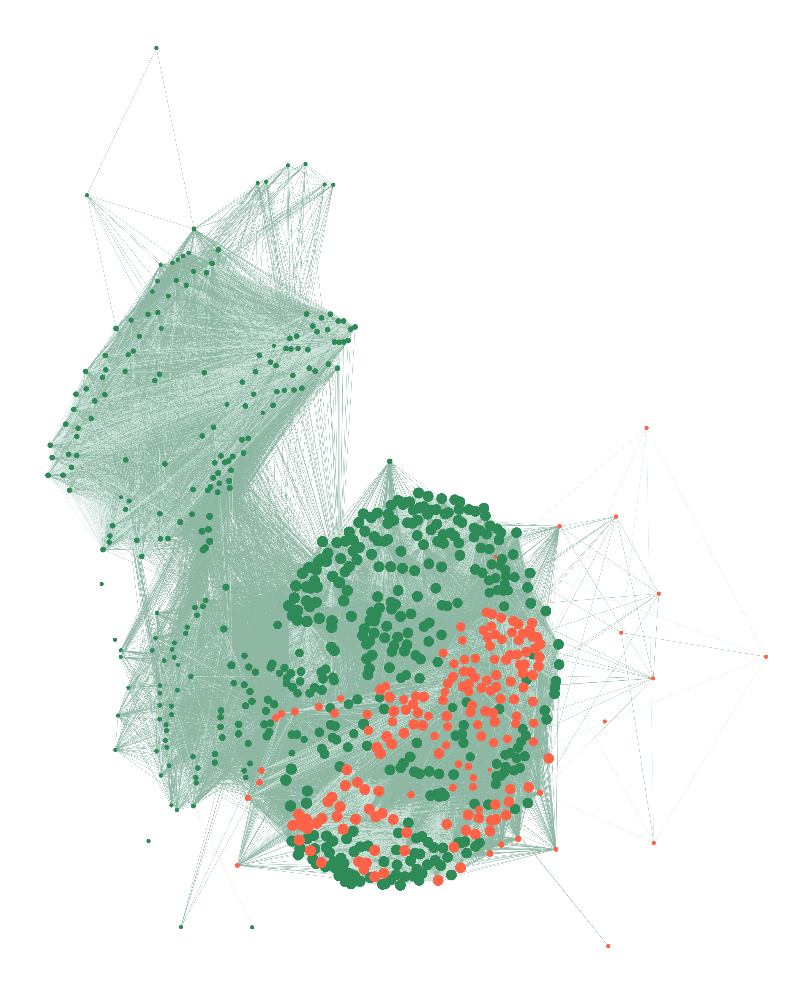

In [36]:
plt.figure(figsize=(40,50))
nx.draw_kamada_kawai(G, with_labels = False, font_size = 17, node_color = node_color, node_size = node_size, edge_color=edge_colours, alpha = 1)
ax = plt.gca()
#plt.savefig("NetworkIndexes.png", dpi=300, bbox_inches='tight')
plt.show()


In [29]:
cluster_df = pd.read_csv("/Users/a/Dropbox/Thesis/Thesis/Coding/PreprocessedData/out-clusters-MFandIndices.csv",index_col=0)

In [33]:
cluster_df["Complete_Corr"].iloc[1]

1

In [55]:
def assign_node_color(classno,cluster):
    if classno == 1:
        if cluster == 1:
            return "seagreen"
        elif cluster == 2:
            return "tomato" 
        else:
            return "royalblue"
    else:
        if cluster == 1:
            return "mediumseagreen"
        elif cluster == 2:
            return "salmon" 
        else:
            return "deepskyblue"
        
def assign_label(name, classno):
    if classno == 1:
        return False #keep only labels of the indices
    else:
        return True


def assign_colour(correlation):
    if correlation <= 0.75:
        return "#8eb7a4"  # dark green
    else:
        return "#cee5db"  # light green

def assign_thickness(correlation, benchmark_thickness=1, scaling_factor=1):
    return benchmark_thickness * abs(correlation)**scaling_factor

def assign_node_size(degree, scaling_factor=30):
    return degree * scaling_factor


# assign colours to edges depending on positive or negative correlation
# assign edge thickness depending on magnitude of correlation
edge_colours = []
edge_width = []
for i in range(len(links_filtered)):
    edge_colours.append(assign_colour(links_filtered.iloc[i]["value"]))
    edge_width.append(assign_thickness(links_filtered.iloc[i]["value"]))

# assign node size depending on number of connections (degree)
node_size = []
for key, value in dict(G.degree).items():
    node_size.append(max(2000,assign_node_size(value))/10)
        
    
node_color = []
for i in range(len(classes)):
    node_color.append(assign_node_color(classes[i],cluster_df["Complete_Corr"].iloc[i]))
    
    
labels = []
for i in range(len(classes)):
    labels.append(assign_label(cluster_df.index[i],classes[i]))

And plot the network.
- Only links where the correlation is higher than 0.5 is shown.
- Here the edges are ligtgreen if their correlation is 0.5-0.75, higher darkblue.
- The nodes are sizes after their degree, but the nodes from the blue and green cluster have a minimum size of 10 to make them clearly visible.

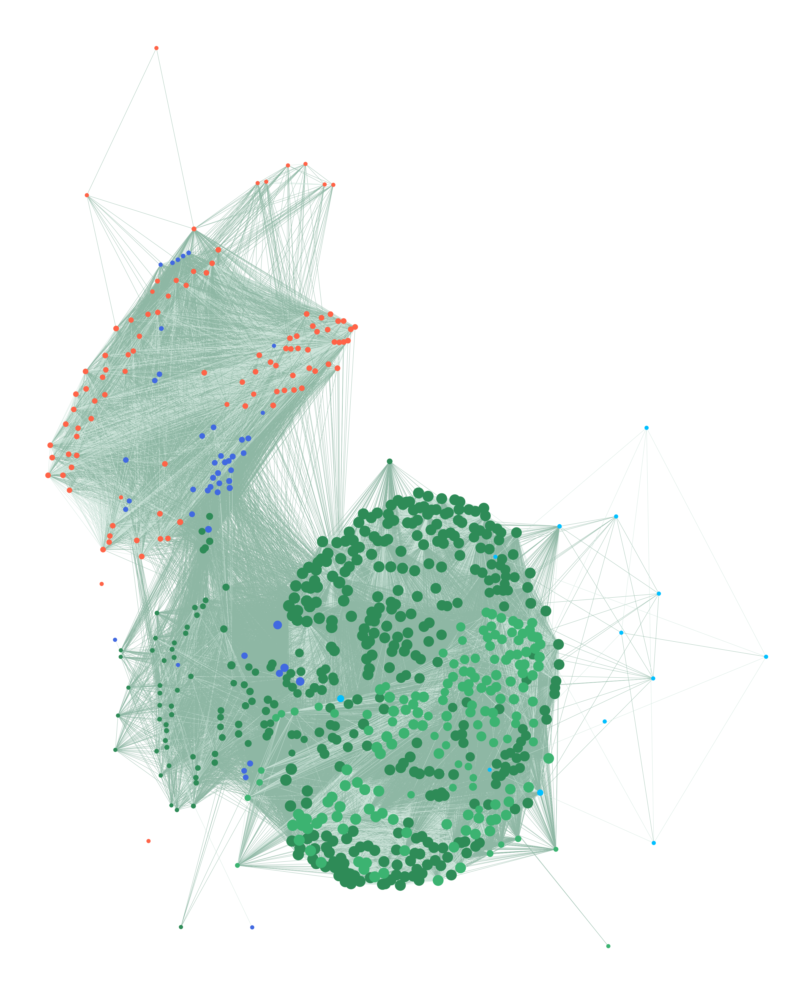

In [56]:
plt.figure(figsize=(40,50))
nx.draw_kamada_kawai(G, with_labels = False, font_size = 17, node_color = node_color, node_size = node_size, edge_color=edge_colours, alpha = 1)
ax = plt.gca()
#plt.savefig("NetworkIndexes.png", dpi=300, bbox_inches='tight')
plt.show()
